# Импорт библиотек и классов для библиотек

In [1]:
import pandas as pd # Импортирует библиотеку pandas для работы с данными в формате DataFrame.
import numpy as np # Импортирует библиотеку NumPy для работы с многомерными массивами и математическими операциями.
import matplotlib.pyplot as plt # Импортирует библиотеку Matplotlib для создания графиков и диаграмм.
import seaborn as sns # Импортирует библиотеку Seaborn для создания статистических графиков и визуализации данных.
import xgboost as xgb # Импортирует библиотеку XGBoost для использования алгоритма XGBoost в задачах машинного обучения.
import lightgbm as lgb #  Импортирует библиотеку LightGBM для использования алгоритма LightGBM в задачах машинного обучения.
import joblib # Импортирует библиотеку joblib для сохранения и загрузки моделей машинного обучения.

from sklearn.model_selection import train_test_split, GridSearchCV # Импортирует функции для разделения данных на обучающую и тестовую выборки и поиска оптимальных гиперпараметров модели.
from sklearn.preprocessing import MinMaxScaler, StandardScaler # Импортирует классы для масштабирования признаков.
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score # Импортирует метрики для оценки качества моделей машинного обучения.
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, StackingRegressor # Импортирует классы ансамблевых регрессоров для использования в задачах машинного обучения.
from sklearn.linear_model import LinearRegression, Ridge # Импортирует классы линейных регрессоров для использования в задачах машинного обучения.
from sklearn.svm import SVR # Импортирует класс регрессора на основе метода опорных векторов (Support Vector Regression, SVR).

from lightgbm import LGBMRegressor # Импортирует класс LGBMRegressor из библиотеки LightGBM для использования в задачах машинного обучения.

from tensorflow.keras.models import Sequential # Импортирует класс Sequential из библиотеки TensorFlow для создания нейронной сети с последовательным соединением слоёв.
from tensorflow.keras.layers import Dense # Импортирует класс Dense для создания полносвязных слоев нейронной сети.
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor #  Импортирует класс KerasRegressor для интеграции моделей нейронных сетей, созданных с использованием TensorFlow, с инструментами Scikit-learn.

from scikeras.wrappers import KerasRegressor # Импортирует класс KerasRegressor из библиотеки SciKeras, который является альтернативным оберткой для интеграции TensorFlow с Scikit-learn.

## Загрузка и обработка входных датасетов

In [2]:
# Загрузка данных из файла X_bp.xlsx с указанием кодировки в DataFrame: 'df1'
df1 = pd.read_excel('C:/Users/Shahm/DataspellProjects/VKR/Shakhmatov_VKR/X_bp.xlsx', engine='openpyxl')

# Вывод общего количества строк и столбцов
df1.shape

(1023, 11)

In [3]:
# Проверка на пропуски
df1.isnull().sum()

Unnamed: 0                              0
Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
dtype: int64

In [4]:
# Проверка на дубликаты
df1.duplicated().sum()

0

In [5]:
# Анализ данных с использованием описательной статистики
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1023.0,511.000000,295.458965,0.000000,255.500000,511.000000,766.500000,1022.000000
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732


In [6]:
# Смотрим первые 5 строк DataFrame: 'df1'
df1.head().T

,0,1,2,3,4
Unnamed: 0,0.000000,1.000000,2.000000,3.000000,4.000000
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000


In [7]:
# Удаление столбца 'Unnamed: 0' с неинформативными данными
df1 = df1.drop(['Unnamed: 0'], axis=1)

# Вывод общего количества строк и столбцов
df1.shape

(1023, 10)

In [8]:
# Смотрим первые 5 строк DataFrame: 'df1'
df1.head().T

,0,1,2,3,4
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
"Потребление смолы, г/м2",220.000000,220.000000,220.000000,220.000000,220.000000


In [9]:
# Загрузка данных из файла X_nup.xlsx с указанием кодировки в DataFrame: 'df2'
df2 = pd.read_excel('C:/Users/Shahm/DataspellProjects/VKR/Shakhmatov_VKR/X_nup.xlsx', engine='openpyxl')

# Вывод общего количества строк и столбцов
df2.shape

(1040, 4)

In [10]:
# Проверка на пропуски
df2.isnull().sum()

Unnamed: 0            0
Угол нашивки, град    0
Шаг нашивки           0
Плотность нашивки     0
dtype: int64

In [11]:
# Проверка на дубликаты
df2.duplicated().sum()

0

In [12]:
# Смотрим первые 5 строк DataFrame: 'df2'
df2.head().T

,0,1,2,3,4
Unnamed: 0,0.0,1.0,2.0,3.0,4.0
"Угол нашивки, град",0.0,0.0,0.0,0.0,0.0
Шаг нашивки,4.0,4.0,4.0,5.0,5.0
Плотность нашивки,57.0,60.0,70.0,47.0,57.0


In [13]:
# Удаление столбца 'Unnamed: 0' с неинформативными данными
df2 = df2.drop(['Unnamed: 0'], axis=1)

# Вывод общего количества строк и столбцов
df2.shape

(1040, 3)

In [14]:
# Смотрим первые 5 строк DataFrame: 'df2'
df2.head().T

,0,1,2,3,4
"Угол нашивки, град",0.0,0.0,0.0,0.0,0.0
Шаг нашивки,4.0,4.0,4.0,5.0,5.0
Плотность нашивки,57.0,60.0,70.0,47.0,57.0


### Объединение данных 'df1' и 'df2' по индексу с использованием функции merge() с параметром 'inner'

In [15]:
# Объединение данных с использованием INNER
data = pd.merge(df1, df2, left_index=True, right_index=True, how='inner')

# Сохранение объединенных данных в новый xlsx-файл
data.to_excel('C:/Users/Shahm/DataspellProjects/VKR/Shakhmatov_VKR/data.xlsx', index=False, engine='openpyxl')

In [16]:
# Загрузка данных из файла data.xlsx с указанием кодировки в DataFrame: 'df'
df = pd.read_excel('C:/Users/Shahm/DataspellProjects/VKR/Shakhmatov_VKR/data.xlsx', engine='openpyxl')

# Приведем столбец "Угол нашивки" к значениям 0 и 1 и integer
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

# Вывод общего количества строк и столбцов
df.shape

(1023, 13)

In [17]:
# Проверка на пропуски
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [18]:
# Проверка на дубликаты
df.duplicated().sum()

0

In [19]:
#Поиск уникальных значений с помощью функции nunique
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [20]:
# Анализ данных с использованием описательной статистики
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [21]:
# Смотрим первые 5 строк DataFrame: 'df'
df.head().T

,0,1,2,3,4
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
"Потребление смолы, г/м2",220.000000,220.000000,220.000000,220.000000,220.000000


## Гистограммы распределения признаков, ящики с усами и попарные графики рассеяния точек для каждой пары переменных

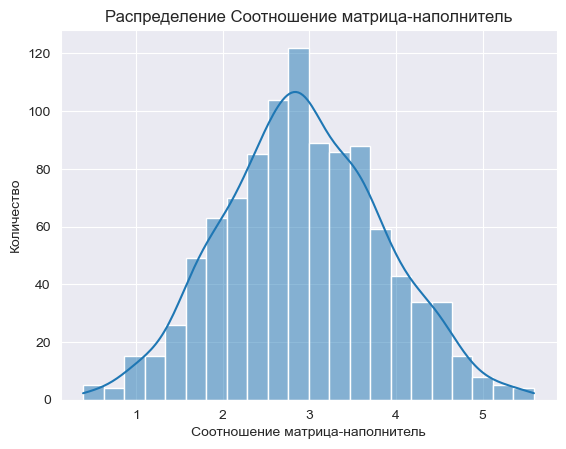

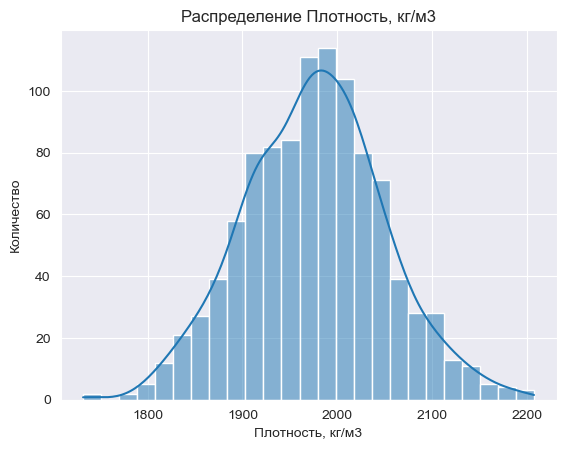

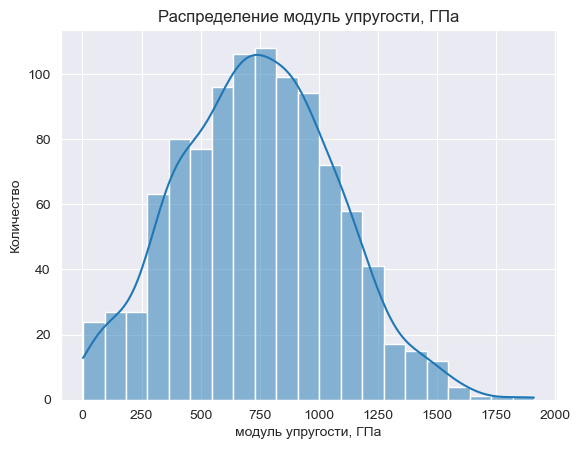

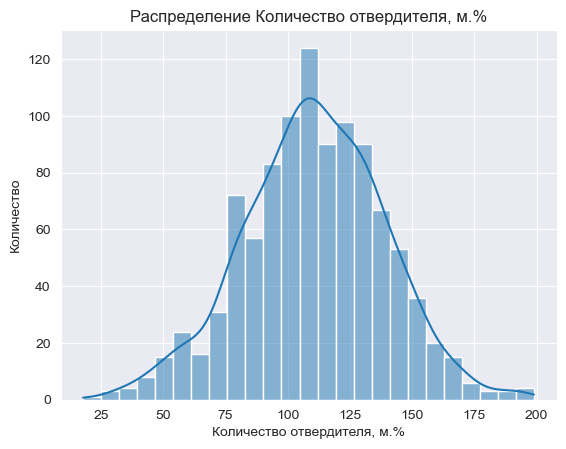

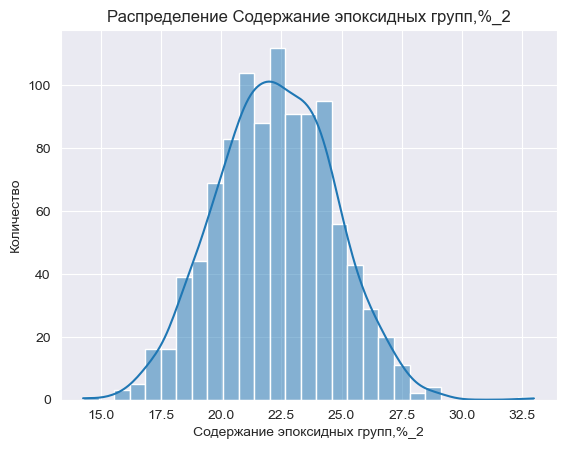

...

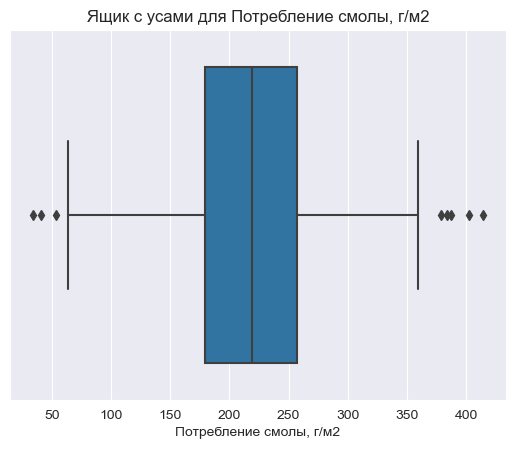

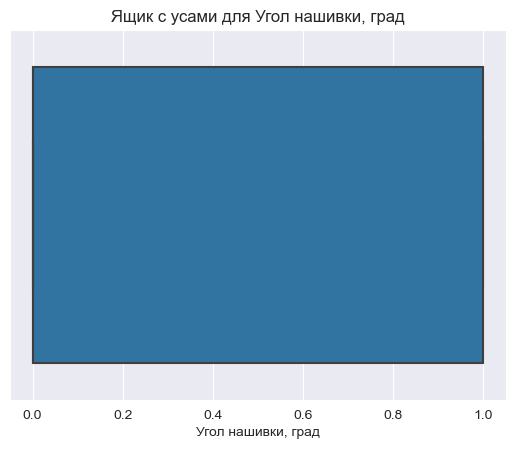

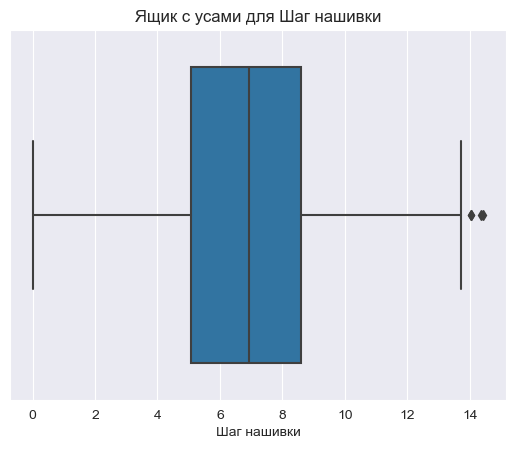

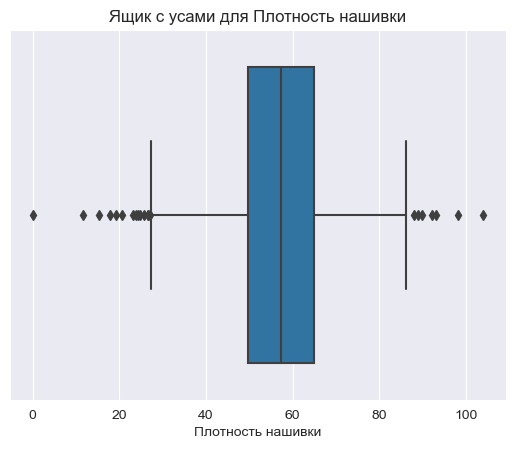

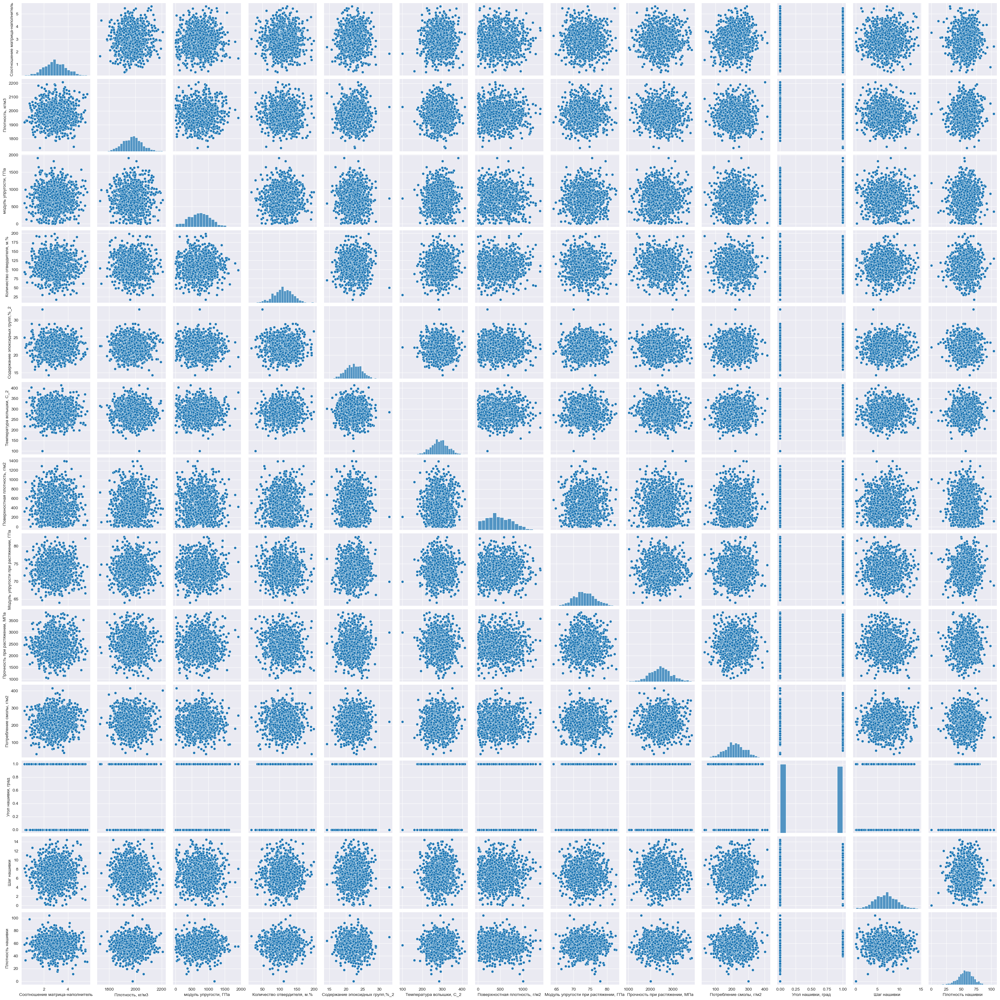

In [22]:
# Гистограммы распределения для каждой переменной
for col in df.columns:
    plt.figure()
    sns.histplot(df[col], kde=True)
    plt.title(f'Распределение {col}')
    plt.xlabel(col)
    plt.ylabel('Количество')
    plt.show()

# Диаграммы ящика с усами для каждой переменной
for col in df.columns:
    plt.figure()
    sns.boxplot(data=df, x=col)
    plt.title(f'Ящик с усами для {col}')
    plt.xlabel(col)
    plt.show()

# Попарные графики рассеяния точек для каждой пары переменных
sns.pairplot(df)
plt.show()

In [23]:
mean_values = df.mean()
median_values = df.median()

print("Средние значения:\n", mean_values)
print("\nМедианные значения:\n", median_values)

Средние значения:
 Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки, град                         0.491691
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64

Медианные значения:
 Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температ

In [24]:
# Удаление выбросов с помощью межквартильного размаха (IQR)
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

cleaned_df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [25]:
# Проверка пропусков
missing_values = cleaned_df.isnull().sum()
print("Пропущенные значения:\n", missing_values)

# Удаление строк с пропусками (если есть)
cleaned_df = cleaned_df.dropna()

Пропущенные значения:
 Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [26]:
# Определение признаков и целевых переменных
X = cleaned_df.drop(['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1)
y1 = cleaned_df['Модуль упругости при растяжении, ГПа']
y2 = cleaned_df['Прочность при растяжении, МПа']

# Разделение на обучающую и тестовую выборки:
X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.3, random_state=42)
X_train, X_test, y2_train, y2_test = train_test_split(X, y2, test_size=0.3, random_state=42)

# Стандартизация данных
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

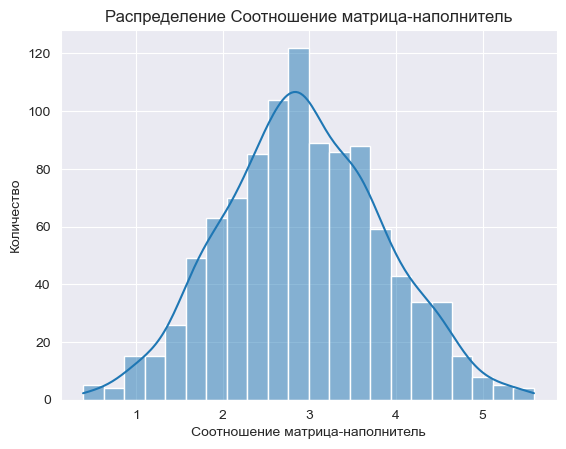

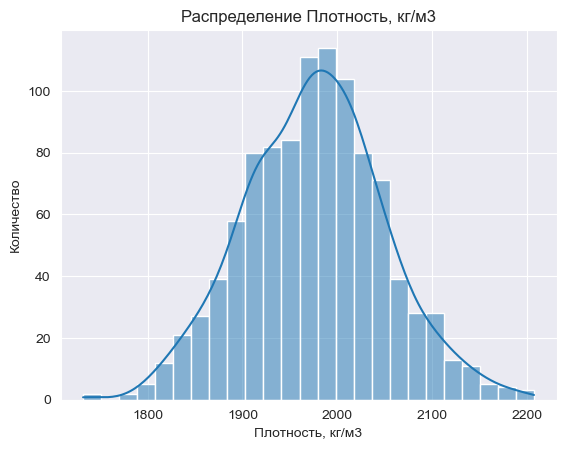

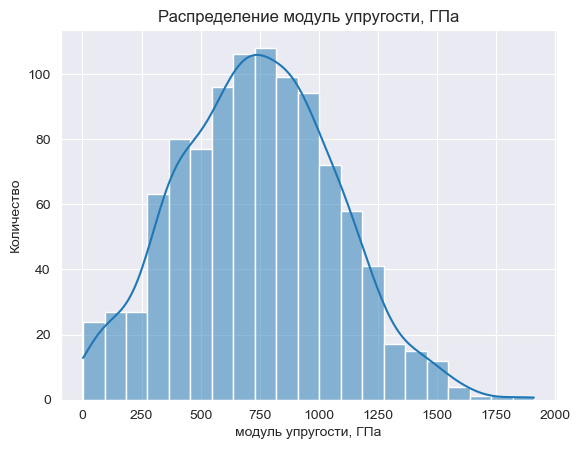

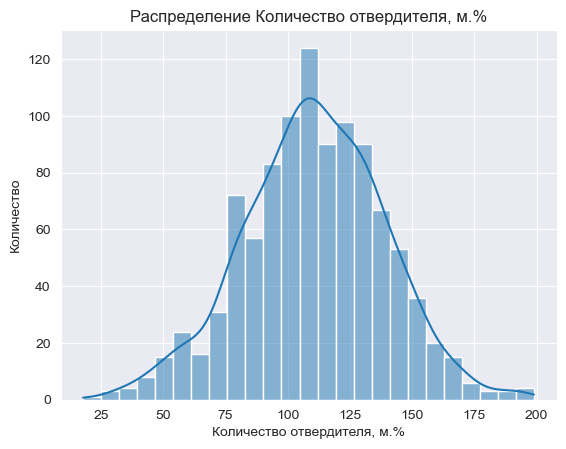

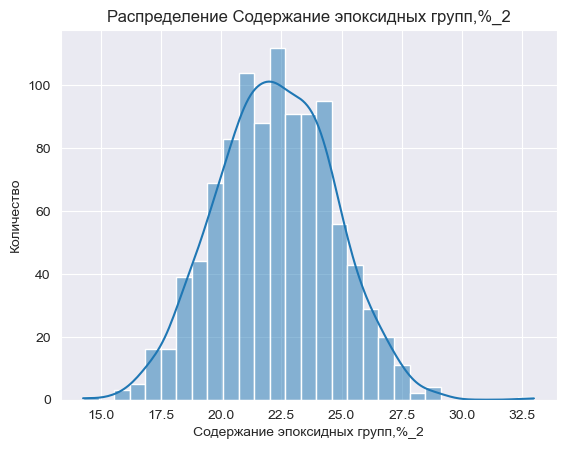

...

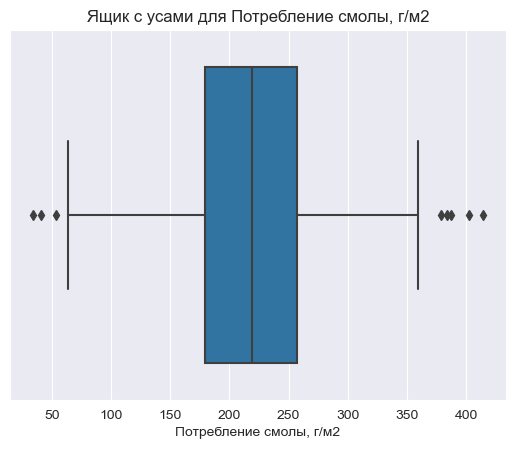

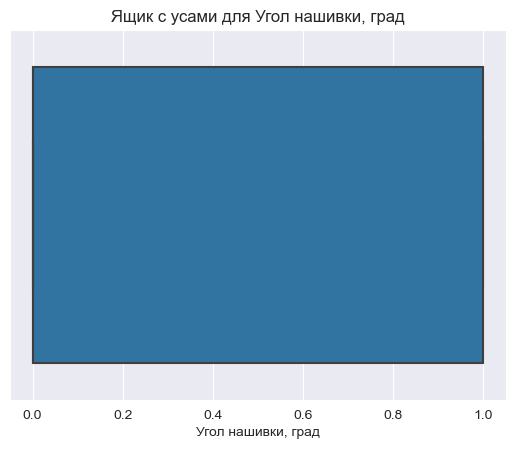

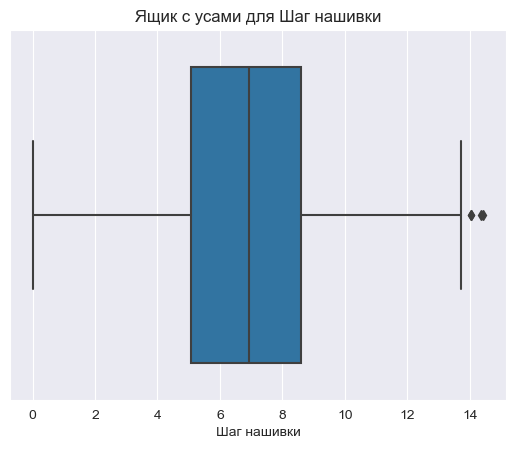

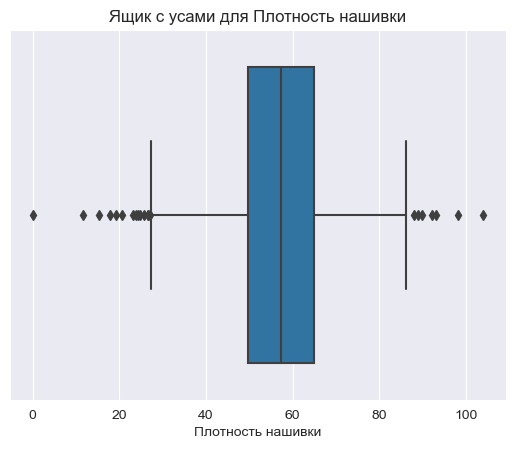

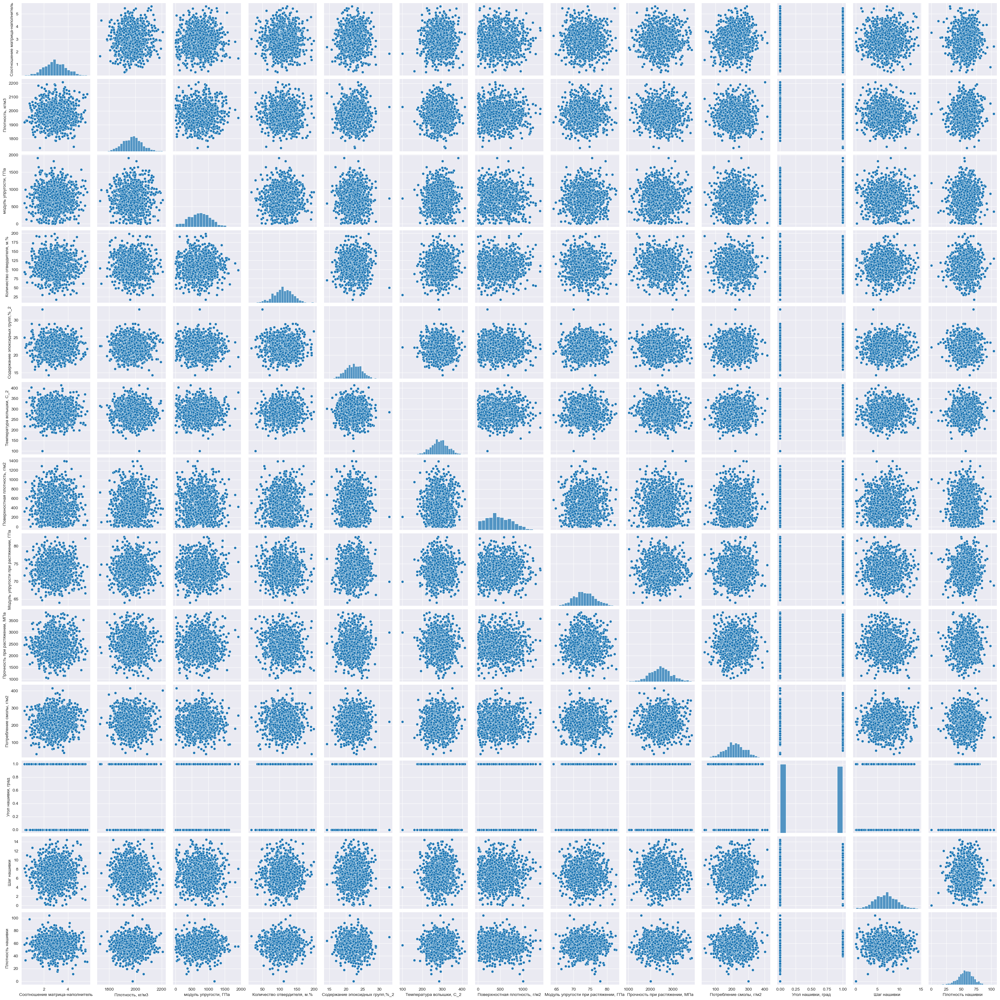

In [27]:
# Гистограммы распределения для каждой переменной
for col in df.columns:
    plt.figure()
    sns.histplot(df[col], kde=True)
    plt.title(f'Распределение {col}')
    plt.xlabel(col)
    plt.ylabel('Количество')
    plt.show()

# Диаграммы ящика с усами для каждой переменной
for col in df.columns:
    plt.figure()
    sns.boxplot(data=df, x=col)
    plt.title(f'Ящик с усами для {col}')
    plt.xlabel(col)
    plt.show()

# Попарные графики рассеяния точек для каждой пары переменных
sns.pairplot(df)
plt.show()

# Попробуем разные алгоритмы машинного обучения

### XGBoost:

In [28]:
# Обучение модели XGBoost для первой целевой переменной
xgb_model1 = xgb.XGBRegressor(random_state=42)
xgb_model1.fit(X_train_scaled, y1_train)
y1_xgb_pred = xgb_model1.predict(X_test_scaled)

# Обучение модели XGBoost для второй целевой переменной
xgb_model2 = xgb.XGBRegressor(random_state=42)
xgb_model2.fit(X_train_scaled, y2_train)
y2_xgb_pred = xgb_model2.predict(X_test_scaled)

def print_metrics(y_true, y_pred, label):
    print(f"Метрики для {label}:")
    print("MAE:", mean_absolute_error(y_true, y_pred))
    print("MSE:", mean_squared_error(y_true, y_pred))
    print("R^2:", r2_score(y_true, y_pred))

# Вывод метрик
print_metrics(y1_test, y1_xgb_pred, "Модуль упругости при растяжении, ГПа (XGBoost)")
print_metrics(y2_test, y2_xgb_pred, "Прочность при растяжении, МПа (XGBoost)")

Метрики для Модуль упругости при растяжении, ГПа (XGBoost):
MAE: 2.571666910307904
MSE: 10.758103736200539
R^2: -0.23454502732237725
Метрики для Прочность при растяжении, МПа (XGBoost):
MAE: 403.1661345240098
MSE: 264381.9443388875
R^2: -0.2953145246003579


In [29]:
# Определение сетки параметров для XGBoost
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.5, 0.8, 1],
    'colsample_bytree': [0.5, 0.8, 1],
}

# Проведение поиска по сетке для первой целевой переменной
xgb_grid_search1 = GridSearchCV(estimator=xgb.XGBRegressor(random_state=42), param_grid=xgb_param_grid, cv=5, n_jobs=-1)
xgb_grid_search1.fit(X_train_scaled, y1_train)

# Получение лучших гиперпараметров для первой целевой переменной
best_xgb_params1 = xgb_grid_search1.best_params_
print("Лучшие гиперпараметры для XGBoost (Модуль упругости при растяжении, ГПа):", best_xgb_params1)

# Обучение модели с лучшими гиперпараметрами для первой целевой переменной
best_xgb1 = xgb.XGBRegressor(**best_xgb_params1, random_state=42)
best_xgb1.fit(X_train_scaled, y1_train)
y1_best_xgb_pred = best_xgb1.predict(X_test_scaled)

# Проведение поиска по сетке для второй целевой переменной
xgb_grid_search2 = GridSearchCV(estimator=xgb.XGBRegressor(random_state=42), param_grid=xgb_param_grid, cv=5, n_jobs=-1)
xgb_grid_search2.fit(X_train_scaled, y2_train)

# Получение лучших гиперпараметров для второй целевой переменной
best_xgb_params2 = xgb_grid_search2.best_params_
print("Лучшие гиперпараметры для XGBoost (Прочность при растяжении, МПа):", best_xgb_params2)

# Обучение модели с лучшими гиперпараметрами для второй целевой переменной
best_xgb2 = xgb.XGBRegressor(**best_xgb_params2, random_state=42)
best_xgb2.fit(X_train_scaled, y2_train)
y2_best_xgb_pred = best_xgb2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_best_xgb_pred, "Модуль упругости при растяжении, ГПа (XGBoost с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_xgb_pred, "Прочность при растяжении, МПа (XGBoost с лучшими гиперпараметраметрами)")

Лучшие гиперпараметры для XGBoost (Модуль упругости при растяжении, ГПа): {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1}
Лучшие гиперпараметры для XGBoost (Прочность при растяжении, МПа): {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.5}
Метрики для Модуль упругости при растяжении, ГПа (XGBoost с лучшими гиперпараметрами):
MAE: 2.428800866050593
MSE: 9.176403165907892
R^2: -0.0530371499445943
Метрики для Прочность при растяжении, МПа (XGBoost с лучшими гиперпараметраметрами):
MAE: 377.39302609629294
MSE: 228562.98641622878
R^2: -0.11982290179196764


### RandomForest:

In [30]:
# Создание и обучение модели RandomForest для обеих целевых переменных
rf_model1 = RandomForestRegressor(random_state=42)
rf_model1.fit(X_train_scaled, y1_train)
y1_rf_pred = rf_model1.predict(X_test_scaled)

rf_model2 = RandomForestRegressor(random_state=42)
rf_model2.fit(X_train_scaled, y2_train)
y2_rf_pred = rf_model2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_rf_pred, "Модуль упругости при растяжении, ГПа (RandomForest)")
print_metrics(y2_test, y2_rf_pred, "Прочность при растяжении, МПа (RandomForest)")

Метрики для Модуль упругости при растяжении, ГПа (RandomForest):
MAE: 2.4313390138604847
MSE: 8.953365864750397
R^2: -0.02744252864299357
Метрики для Прочность при растяжении, МПа (RandomForest):
MAE: 375.0287738581754
MSE: 218366.99293034483
R^2: -0.06986858858036937


In [31]:
# Определение диапазонов гиперпараметров для поиска
param_grid = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Создание модели RandomForest
rf = RandomForestRegressor()

# Проведение поиска по сетке для первой целевой переменной
grid_search1 = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search1.fit(X_train, y1_train)

# Получение лучших гиперпараметров для первой целевой переменной
best_params1 = grid_search1.best_params_
print("Лучшие гиперпараметры для RandomForestRegressor (Модуль упругости при растяжении, ГПа):", best_params1)

# Обучение модели с лучшими гиперпараметрами для первой целевой переменной
best_rf1 = RandomForestRegressor(**best_params1)
best_rf1.fit(X_train, y1_train)

# Проведение поиска по сетке для второй целевой переменной
grid_search2 = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search2.fit(X_train, y2_train)

# Получение лучших гиперпараметров для второй целевой переменной
best_params2 = grid_search2.best_params_
print("Лучшие гиперпараметры для RandomForestRegressor (Прочность при растяжении, МПа):", best_params2)

# Обучение модели с лучшими гиперпараметрами для второй целевой переменной
best_rf2 = RandomForestRegressor(**best_params2)
best_rf2.fit(X_train, y2_train)

# Предсказание значений на тестовой выборке для первой целевой переменной
y1_best_rf_pred = best_rf1.predict(X_test)

# Предсказание значений на тестовой выборке для второй целевой переменной
y2_best_rf_pred = best_rf2.predict(X_test)

# Вывод метрик
print_metrics(y1_test, y1_best_rf_pred, "Модуль упругости при растяжении, ГПа (RandomForest с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_rf_pred, "Прочность при растяжении, МПа (RandomForest с лучшими гиперпараметрами)")

Лучшие гиперпараметры для RandomForestRegressor (Модуль упругости при растяжении, ГПа): {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}
Лучшие гиперпараметры для RandomForestRegressor (Прочность при растяжении, МПа): {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Метрики для Модуль упругости при растяжении, ГПа (RandomForest с лучшими гиперпараметрами):
MAE: 2.3939535691886062
MSE: 8.788638414938461
R^2: -0.008539248007716438
Метрики для Прочность при растяжении, МПа (RandomForest с лучшими гиперпараметрами):
MAE: 371.47090884406214
MSE: 218282.4059014261
R^2: -0.06945416237049629


### LightGBM:

In [32]:
# Обучение модели LightGBM для первой целевой переменной
lgbm_model1 = LGBMRegressor(random_state=42)
lgbm_model1.fit(X_train_scaled, y1_train)
y1_lgbm_pred = lgbm_model1.predict(X_test_scaled)

# Обучение модели LightGBM для второй целевой переменной
lgbm_model2 = LGBMRegressor(random_state=42)
lgbm_model2.fit(X_train_scaled, y2_train)
y2_lgbm_pred = lgbm_model2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_lgbm_pred, "Модуль упругости при растяжении, ГПа (LightGBM)")
print_metrics(y2_test, y2_lgbm_pred, "Прочность при растяжении, МПа (LightGBM)")

Метрики для Модуль упругости при растяжении, ГПа (LightGBM):
MAE: 2.4936097212265667
MSE: 9.78900403205559
R^2: -0.12333609589091044
Метрики для Прочность при растяжении, МПа (LightGBM):
MAE: 395.57855958399404
MSE: 245500.4682228833
R^2: -0.20280650435671688


In [33]:
# Определение сетки параметров для LightGBM
lgbm_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.5, 0.8, 1],
    'colsample_bytree': [0.5, 0.8, 1],
}

# Проведение поиска по сетке для первой целевой переменной
lgbm_grid_search1 = GridSearchCV(estimator=LGBMRegressor(random_state=42), param_grid=lgbm_param_grid, cv=5, n_jobs=-1)
lgbm_grid_search1.fit(X_train_scaled, y1_train)

# Получение лучших гиперпараметров для первой целевой переменной
best_lgbm_params1 = lgbm_grid_search1.best_params_
print("Лучшие гиперпараметры для LightGBM (Модуль упругости при растяжении, ГПа):", best_lgbm_params1)

# Обучение модели с лучшими гиперпараметрами для первой целевой переменной
best_lgbm1 = LGBMRegressor(**best_lgbm_params1, random_state=42)
best_lgbm1.fit(X_train_scaled, y1_train)
y1_best_lgbm_pred = best_lgbm1.predict(X_test_scaled)

# Проведение поиска по сетке для второй целевой переменной
lgbm_grid_search2 = GridSearchCV(estimator=LGBMRegressor(random_state=42), param_grid=lgbm_param_grid, cv=5, n_jobs=-1)
lgbm_grid_search2.fit(X_train_scaled, y2_train)

# Получение лучших гиперпараметров для второй целевой переменной
best_lgbm_params2 = lgbm_grid_search2.best_params_
print("Лучшие гиперпараметры для LightGBM (Прочность при растяжении, МПа):", best_lgbm_params2)

# Обучение модели с лучшими гиперпараметрами для второй целевой переменной
best_lgbm2 = LGBMRegressor(**best_lgbm_params2, random_state=42)
best_lgbm2.fit(X_train_scaled, y2_train)
y2_best_lgbm_pred = best_lgbm2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_best_lgbm_pred, "Модуль упругости при растяжении, ГПа (LightGBM с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_lgbm_pred, "Прочность при растяжении, МПа (LightGBM с лучшими гиперпараметрами)")

Лучшие гиперпараметры для LightGBM (Модуль упругости при растяжении, ГПа): {'colsample_bytree': 0.5, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.5}
Лучшие гиперпараметры для LightGBM (Прочность при растяжении, МПа): {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.5}
Метрики для Модуль упругости при растяжении, ГПа (LightGBM с лучшими гиперпараметрами):
MAE: 2.3981260705126233
MSE: 8.736474042102808
R^2: -0.0025531310612003644
Метрики для Прочность при растяжении, МПа (LightGBM с лучшими гиперпараметрами):
MAE: 362.45222953650955
MSE: 211154.45878845334
R^2: -0.03453145443329331


## Стекинг моделей

In [34]:
# Создание стекинг-регрессора с использованием RandomForestRegressor, XGBoost и LightGBM
stacking_regressor = StackingRegressor(
    estimators=[
        ('rf', RandomForestRegressor(random_state=42)),
        ('xgb', xgb.XGBRegressor(random_state=42)),
        ('lgb', lgb.LGBMRegressor(random_state=42))
    ],
    final_estimator=Ridge()
)

# Обучение модели для первой целевой переменной
stacking_regressor.fit(X_train_scaled, y1_train)
y1_stacking_pred = stacking_regressor.predict(X_test_scaled)

# Обучение модели для второй целевой переменной
stacking_regressor.fit(X_train_scaled, y2_train)
y2_stacking_pred = stacking_regressor.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_stacking_pred, "Модуль упругости при растяжении, ГПа (Стекинг моделей)")
print_metrics(y2_test, y2_stacking_pred, "Прочность при растяжении, МПа (Стекинг моделей)")

Метрики для Модуль упругости при растяжении, ГПа (Стекинг моделей):
MAE: 2.4346162250177534
MSE: 8.945826566357024
R^2: -0.026577357273645408
Метрики для Прочность при растяжении, МПа (Стекинг моделей):
MAE: 362.35689574151803
MSE: 212035.88257363322
R^2: -0.038849907549018514


In [35]:
# Создание стекинг-регрессора с использованием RandomForestRegressor, XGBoost и LightGBM с лучшими гиперпараметрами
stacking_regressor1 = StackingRegressor(
    estimators=[
        ('rf', best_rf1),
        ('xgb', best_xgb1),
        ('lgb', best_lgbm1)
    ],
    final_estimator=Ridge()
)

# Обучение модели для первой целевой переменной
stacking_regressor1.fit(X_train_scaled, y1_train)
y1_stacking_pred = stacking_regressor1.predict(X_test_scaled)

# Создание стекинг-регрессора с использованием RandomForestRegressor, XGBoost и LightGBM с лучшими гиперпараметрами
stacking_regressor2 = StackingRegressor(
    estimators=[
        ('rf', best_rf2),
        ('xgb', best_xgb2),
        ('lgb', best_lgbm2)
    ],
    final_estimator=Ridge()
)

# Обучение модели для второй целевой переменной
stacking_regressor2.fit(X_train_scaled, y2_train)
y2_stacking_pred = stacking_regressor2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_stacking_pred, "Модуль упругости при растяжении, ГПа (Стекинг моделей с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_stacking_pred, "Прочность при растяжении, МПа (Стекинг моделей с лучшими гиперпараметрами)")

Метрики для Модуль упругости при растяжении, ГПа (Стекинг моделей с лучшими гиперпараметрами):
MAE: 2.41806507195755
MSE: 8.952959884582508
R^2: -0.027395940432863863
Метрики для Прочность при растяжении, МПа (Стекинг моделей с лучшими гиперпараметрами):
MAE: 362.04949527210005
MSE: 211434.5599170444
R^2: -0.035903783625924834


### AdaBoost:

In [36]:
# AdaBoost
ada_model1 = AdaBoostRegressor(random_state=42)
ada_model1.fit(X_train_scaled, y1_train)
y1_ada_pred = ada_model1.predict(X_test_scaled)

ada_model2 = AdaBoostRegressor(random_state=42)
ada_model2.fit(X_train_scaled, y2_train)
y2_ada_pred = ada_model2.predict(X_test_scaled)

print_metrics(y1_test, y1_ada_pred, "Модуль упругости при растяжении, ГПа (AdaBoost)")
print_metrics(y2_test, y2_ada_pred, "Прочность при растяжении, МПа (AdaBoost)")

Метрики для Модуль упругости при растяжении, ГПа (AdaBoost):
MAE: 2.463124155517075
MSE: 9.060879273519436
R^2: -0.03978021820436717
Метрики для Прочность при растяжении, МПа (AdaBoost):
MAE: 372.90534397369163
MSE: 222469.6470780942
R^2: -0.089969157551826


In [37]:
# Зададим сетку гиперпараметров для AdaBoost
param_grid_ada = {
    'n_estimators': [10, 50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.5, 1]
}

# Проведение поиска по сетке для первой целевой переменной
grid_search_ada1 = GridSearchCV(estimator=AdaBoostRegressor(random_state=42), param_grid=param_grid_ada, cv=5, n_jobs=-1)
grid_search_ada1.fit(X_train_scaled, y1_train)

# Получение лучших гиперпараметров для первой целевой переменной
best_params_ada1 = grid_search_ada1.best_params_
print("Лучшие гиперпараметры для AdaBoostRegressor (Модуль упругости при растяжении, ГПа):", best_params_ada1)

# Обучение модели с лучшими гиперпараметрами для первой целевой переменной
best_ada1 = AdaBoostRegressor(**best_params_ada1, random_state=42)
best_ada1.fit(X_train_scaled, y1_train)
y1_best_ada_pred = best_ada1.predict(X_test_scaled)

# Проведение поиска по сетке для второй целевой переменной
grid_search_ada2 = GridSearchCV(estimator=AdaBoostRegressor(random_state=42), param_grid=param_grid_ada, cv=5, n_jobs=-1)
grid_search_ada2.fit(X_train_scaled, y2_train)

# Получение лучших гиперпараметров для второй целевой переменной
best_params_ada2 = grid_search_ada2.best_params_
print("Лучшие гиперпараметры для AdaBoostRegressor (Прочность при растяжении, МПа):", best_params_ada2)

# Обучение модели с лучшими гиперпараметрами для второй целевой переменной
best_ada2 = AdaBoostRegressor(**best_params_ada2, random_state=42)
best_ada2.fit(X_train_scaled, y2_train)
y2_best_ada_pred = best_ada2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_best_ada_pred, "Модуль упругости при растяжении, ГПа (AdaBoost с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_ada_pred, "Прочность при растяжении, МПа (AdaBoost с лучшими гиперпараметрами)")

Лучшие гиперпараметры для AdaBoostRegressor (Модуль упругости при растяжении, ГПа): {'learning_rate': 0.01, 'n_estimators': 200}
Лучшие гиперпараметры для AdaBoostRegressor (Прочность при растяжении, МПа): {'learning_rate': 0.01, 'n_estimators': 200}
Метрики для Модуль упругости при растяжении, ГПа (AdaBoost с лучшими гиперпараметрами):
MAE: 2.413929762977956
MSE: 8.809851344718977
R^2: -0.010973535463725259
Метрики для Прочность при растяжении, МПа (AdaBoost с лучшими гиперпараметрами):
MAE: 365.5190088859225
MSE: 214823.25879915405
R^2: -0.05250639577657634


### Support Vector Machines:

In [38]:
# Создание и обучение модели SVR для обеих целевых переменных
svr_model1 = SVR()
svr_model1.fit(X_train_scaled, y1_train)
y1_svr_pred = svr_model1.predict(X_test_scaled)

svr_model2 = SVR()
svr_model2.fit(X_train_scaled, y2_train)
y2_svr_pred = svr_model2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_svr_pred, "Модуль упругости при растяжении, ГПа (SVR)")
print_metrics(y2_test, y2_svr_pred, "Прочность при растяжении, МПа (SVR)")

Метрики для Модуль упругости при растяжении, ГПа (SVR):
MAE: 2.4280526754666343
MSE: 8.859914721727328
R^2: -0.01671855286197288
Метрики для Прочность при растяжении, МПа (SVR):
MAE: 361.3675779634717
MSE: 211318.69889248855
R^2: -0.03533613340942643


In [39]:
# Зададим сетку гиперпараметров для SVR
param_grid_svr = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.01, 0.1, 1, 10]
}

# Проведение поиска по сетке для первой целевой переменной
grid_search_svr1 = GridSearchCV(estimator=SVR(), param_grid=param_grid_svr, cv=5, n_jobs=-1)
grid_search_svr1.fit(X_train_scaled, y1_train)

# Получение лучших гиперпараметров для первой целевой переменной
best_params_svr1 = grid_search_svr1.best_params_
print("Лучшие гиперпараметры для SVR (Модуль упругости при растяжении, ГПа):", best_params_svr1)

# Обучение модели с лучшими гиперпараметрами для первой целевой переменной
best_svr1 = SVR(**best_params_svr1)
best_svr1.fit(X_train_scaled, y1_train)
y1_best_svr_pred = best_svr1.predict(X_test_scaled)

# Проведение поиска по сетке для второй целевой переменной
grid_search_svr2 = GridSearchCV(estimator=SVR(), param_grid=param_grid_svr, cv=5, n_jobs=-1)
grid_search_svr2.fit(X_train_scaled, y2_train)

# Получение лучших гиперпараметров для второй целевой переменной
best_params_svr2 = grid_search_svr2.best_params_
print("Лучшие гиперпараметры для SVR (Прочность при растяжении, МПа):", best_params_svr2)

# Обучение модели с лучшими гиперпараметрами для второй целевой переменной
best_svr2 = SVR(**best_params_svr2)
best_svr2.fit(X_train_scaled, y2_train)
y2_best_svr_pred = best_svr2.predict(X_test_scaled)

# Вывод метрик
print_metrics(y1_test, y1_best_svr_pred, "Модуль упругости при растяжении, ГПа (SVR с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_svr_pred, "Прочность при растяжении, МПа (SVR с лучшими гиперпараметрами)")

Лучшие гиперпараметры для SVR (Модуль упругости при растяжении, ГПа): {'C': 0.1, 'epsilon': 0.1, 'kernel': 'rbf'}
Лучшие гиперпараметры для SVR (Прочность при растяжении, МПа): {'C': 1, 'epsilon': 1, 'kernel': 'sigmoid'}
Метрики для Модуль упругости при растяжении, ГПа (SVR с лучшими гиперпараметрами):
MAE: 2.397973655411188
MSE: 8.695830920687024
R^2: 0.002110865928331762
Метрики для Прочность при растяжении, МПа (SVR с лучшими гиперпараметрами):
MAE: 361.7538472632284
MSE: 211726.2317099784
R^2: -0.03733280220262225


### Нейронные сети (используя Keras и TensorFlow):

In [40]:
# Функция для создания нейронной сети
def create_nn_model(input_dim):
    def build_model():
        model = Sequential()
        model.add(Dense(32, input_dim=input_dim, activation='relu'))
        model.add(Dense(16, activation='relu'))
        model.add(Dense(8, activation='relu'))
        model.add(Dense(1, activation='linear'))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

    keras_regressor = KerasRegressor(build_model, epochs=100, batch_size=16, verbose=0)
    return keras_regressor

nn_model1 = create_nn_model(X_train_scaled.shape[1])
nn_model1.fit(X_train_scaled, y1_train)

nn_model2 = create_nn_model(X_train_scaled.shape[1])
nn_model2.fit(X_train_scaled, y2_train)

y1_nn_pred = nn_model1.predict(X_test_scaled).flatten()
y2_nn_pred = nn_model2.predict(X_test_scaled).flatten()

# Вывод метрик
print_metrics(y1_test, y1_nn_pred, "Модуль упругости при растяжении, ГПа (Neural Network)")
print_metrics(y2_test, y2_nn_pred, "Прочность при растяжении, МПа (Neural Network)")

Метрики для Модуль упругости при растяжении, ГПа (Neural Network):
MAE: 3.0543761826117297
MSE: 14.573961501139443
R^2: -0.6724333712340473
Метрики для Прочность при растяжении, МПа (Neural Network):
MAE: 409.64484219938754
MSE: 258032.26605926137
R^2: -0.2642048717732477


In [41]:
def create_nn_model(input_dim, n_layers, n_neurons, optimizer='adam'):
    model = Sequential()

    model.add(Dense(n_neurons, input_dim=input_dim, activation='relu'))
    for _ in range(n_layers - 1):
        model.add(Dense(n_neurons, activation='relu'))

    model.add(Dense(1, activation='linear'))
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Создание KerasRegressor
nn_reg = KerasRegressor(model=create_nn_model, model__input_dim=X_train_scaled.shape[1], verbose=0)

# Зададим сетку гиперпараметров для нейронной сети
param_grid_nn = {
    'model__n_layers': [1, 2, 3],
    'model__n_neurons': [16, 32, 64],
    'batch_size': [8, 16, 32],
    'epochs': [100]
}

# Проведение поиска по сетке для обеих целевых переменных
grid_search_nn1 = GridSearchCV(estimator=nn_reg, param_grid=param_grid_nn, cv=3, n_jobs=1)
grid_search_nn1.fit(X_train_scaled, y1_train)

grid_search_nn2 = GridSearchCV(estimator=nn_reg, param_grid=param_grid_nn, cv=3, n_jobs=1)
grid_search_nn2.fit(X_train_scaled, y2_train)

# Получение лучших гиперпараметров для нейронной сети
best_params_nn1 = grid_search_nn1.best_params_
best_params_nn2 = grid_search_nn2.best_params_
print("Лучшие гиперпараметры для нейронной сети (Модуль упругости при растяжении, ГПа):", best_params_nn1)
print("Лучшие гиперпараметры для нейронной сети (Прочность при растяжении, МПа):", best_params_nn2)

# Обучение моделей с лучшими гиперпараметрами
best_nn1 = create_nn_model(X_train_scaled.shape[1], best_params_nn1['model__n_layers'], best_params_nn1['model__n_neurons'])
best_nn1.fit(X_train_scaled, y1_train, epochs=100, batch_size=best_params_nn1['batch_size'], verbose=0)
y1_best_nn_pred = best_nn1.predict(X_test_scaled).flatten()

best_nn2 = create_nn_model(X_train_scaled.shape[1], best_params_nn2['model__n_layers'], best_params_nn2['model__n_neurons'])
best_nn2.fit(X_train_scaled, y2_train, epochs=100, batch_size=best_params_nn2['batch_size'], verbose=0)
y2_best_nn_pred = best_nn2.predict(X_test_scaled).flatten()

# Вывод метрик с лучшими гиперпараметрами
print_metrics(y1_test, y1_best_nn_pred, "Модуль упругости при растяжении, ГПа (Нейронная сеть с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_nn_pred, "Прочность при растяжении, МПа (Нейронная сеть с лучшими гиперпараметрами)")

Лучшие гиперпараметры для нейронной сети (Модуль упругости при растяжении, ГПа): {'batch_size': 16, 'epochs': 100, 'model__n_layers': 3, 'model__n_neurons': 64}
Лучшие гиперпараметры для нейронной сети (Прочность при растяжении, МПа): {'batch_size': 8, 'epochs': 100, 'model__n_layers': 2, 'model__n_neurons': 32}
9/9 [==============================] - 0s 2ms/step
Метрики для Модуль упругости при растяжении, ГПа (Нейронная сеть с лучшими гиперпараметрами):
MAE: 3.1226541962276255
MSE: 15.355518972349001
R^2: -0.7621209140676113
Метрики для Прочность при растяжении, МПа (Нейронная сеть с лучшими гиперпараметрами):
MAE: 395.28549027450543
MSE: 238024.59907874383
R^2: -0.16617918507956175


## Реализации Stacking с использованием библиотеки scikit-learn:

In [42]:
# Создание базовых моделей
base_models1 = [
    ('random_forest', rf_model1),
    ('xgboost', xgb_model1),
    ('svr', svr_model1),
    ('neural_network', nn_model1),
    ('adaboost', ada_model1),
    ('lightgbm', lgbm_model1),
]

base_models2 = [
    ('random_forest', rf_model2),
    ('xgboost', xgb_model2),
    ('svr', svr_model2),
    ('neural_network', nn_model2),
    ('adaboost', ada_model2),
    ('lightgbm', lgbm_model2),
]

meta_model = LinearRegression()

# Создание Stacking ансамбля с базовыми моделями
stacking_model1 = StackingRegressor(estimators=base_models1, final_estimator=meta_model, cv=5)
stacking_model1.fit(X_train_scaled, y1_train)
y1_stacking_pred = stacking_model1.predict(X_test_scaled)

stacking_model2 = StackingRegressor(estimators=base_models2, final_estimator=meta_model, cv=5)
stacking_model2.fit(X_train_scaled, y2_train)
y2_stacking_pred = stacking_model2.predict(X_test_scaled)

# Вывод метрик с базовыми моделями
print_metrics(y1_test, y1_stacking_pred, "Модуль упругости при растяжении, ГПа (Stacking)")
print_metrics(y2_test, y2_stacking_pred, "Прочность при растяжении, МПа (Stacking)")

Метрики для Модуль упругости при растяжении, ГПа (Stacking):
MAE: 2.413502160532937
MSE: 8.863466552283572
R^2: -0.017126142792189825
Метрики для Прочность при растяжении, МПа (Stacking):
MAE: 363.50877445806594
MSE: 214190.04559762255
R^2: -0.04940402712139669


In [43]:
# Создание базовых моделей с лучшими гиперпараметрами
best_base_models1 = [
    ('best_random_forest', best_rf1),
    ('best_xgboost', best_xgb1),
    ('best_svr', best_svr1),
    ('best_neural_network', KerasRegressor(model=create_nn_model, model__input_dim=X_train_scaled.shape[1], verbose=0, **best_params_nn1)),
    ('best_adaboost', best_ada1),
    ('best_lightgbm', best_lgbm1),
]

best_base_models2 = [
    ('best_random_forest', best_rf2),
    ('best_xgboost', best_xgb2),
    ('best_svr', best_svr2),
    ('best_neural_network', KerasRegressor(model=create_nn_model, model__input_dim=X_train_scaled.shape[1], verbose=0, **best_params_nn2)),
    ('best_adaboost', best_ada2),
    ('best_lightgbm', best_lgbm2),
]

# Создание Stacking ансамбля с лучшими гиперпараметрами
best_stacking_model1 = StackingRegressor(estimators=best_base_models1, final_estimator=meta_model, cv=5)
best_stacking_model1.fit(X_train_scaled, y1_train)
y1_best_stacking_pred = best_stacking_model1.predict(X_test_scaled)

best_stacking_model2 = StackingRegressor(estimators=best_base_models2, final_estimator=meta_model, cv=5)
best_stacking_model2.fit(X_train_scaled, y2_train)
y2_best_stacking_pred = best_stacking_model2.predict(X_test_scaled)

# Вывод метрик с лучшими гиперпараметрами
print_metrics(y1_test, y1_best_stacking_pred, "Модуль упругости при растяжении, ГПа (Stacking с лучшими гиперпараметрами)")
print_metrics(y2_test, y2_best_stacking_pred, "Прочность при растяжении, МПа (Stacking с лучшими гиперпараметрами)")

Метрики для Модуль упругости при растяжении, ГПа (Stacking с лучшими гиперпараметрами):
MAE: 2.37499577112408
MSE: 8.722115431843298
R^2: -0.0009054102983405699
Метрики для Прочность при растяжении, МПа (Stacking с лучшими гиперпараметрами):
MAE: 364.2852231271611
MSE: 214429.0914087662
R^2: -0.05057520963914941


In [44]:
# Создание списка различных соотношений матрица-наполнитель
matrix_filler_ratios = np.linspace(0.1, 1.0, num=100).reshape(-1, 1)

# Добавление остальных признаков (средние значения обучающего набора данных)
other_features = np.array([X_train.mean(axis=0)] * len(matrix_filler_ratios))
new_data = np.copy(other_features)
new_data[:, 0] = matrix_filler_ratios.ravel()

# Создание и масштабирование новых данных
new_data_scaled = scaler.transform(new_data)

# Получаем предсказанные значения модуля упругости при растяжении для каждого соотношения
predicted_y1_values = best_stacking_model1.predict(new_data_scaled)

# Получаем предсказанные значения прочности при растяжении для каждого соотношения
predicted_y2_values = best_stacking_model2.predict(new_data_scaled)

# Находим индекс максимального значения предсказанного модуля упругости при растяжении и прочности при растяжении
optimal_index = np.argmax(predicted_y1_values * predicted_y2_values)

# Получаем оптимальное соотношение матрица-наполнитель
optimal_ratio = matrix_filler_ratios[optimal_index][0]

print(f"Рекомендуемое соотношение матрица-наполнитель: {optimal_ratio:.2f}")

C:\Users\Shahm\anaconda3\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Рекомендуемое соотношение матрица-наполнитель: 0.80


In [45]:
# Обучение моделей и сохранение архитектуры и весов нейронных сетей для каждого ансамбля
for idx, (name, model) in enumerate(best_base_models1):
    if name == 'best_neural_network':
        model.fit(X_train_scaled, y1_train)
        # Сохранение архитектуры модели
        with open(f'best_neural_network1_architecture.json', 'w') as f:
            f.write(model.model_.to_json())
        # Сохранение весов модели
        model.model_.save_weights('best_neural_network1_weights.h5')

# Обучение моделей и сохранение архитектуры и весов нейронных сетей для каждого ансамбля
for idx, (name, model) in enumerate(best_base_models2):
    if name == 'best_neural_network':
        model.fit(X_train_scaled, y2_train)
        # Сохранение архитектуры модели
        with open(f'best_neural_network2_architecture.json', 'w') as f:
            f.write(model.model_.to_json())
        # Сохранение весов модели
        model.model_.save_weights('best_neural_network2_weights.h5')

joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

In [46]:
!pip freeze > requirements.txt